# Integrate All ten datasets in one Visualization

### Import modules, set paths, load files:

In [1]:
# !pip install scanpy
# !pip install ipywidgets
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import os

from tqdm import tqdm

In [2]:
# !pip install scarches
# !pip install -U pandas==2.0

import scarches as sca

 captum (see https://github.com/pytorch/captum).


In [3]:
# https://github.com/huggingface/transformers/issues/29763
# pip install transformers==4.37.2
import torch

In [4]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

In [5]:
sc.set_figure_params(dpi=120, figsize=(8, 8))

### Read Anndata

In [22]:
adata_concat = sc.read('/home/fanhuan/data/BioInfo/453k/all-with_annotation-pca_200.h5ad')

sc.tl.pca(adata_concat, n_comps=200)

In [27]:
adata_concat.write_h5ad(
    '/home/fanhuan/data/BioInfo/453k/all-with_annotation-pca_200.h5ad'
)

In [29]:
adata_concat

AnnData object with n_obs × n_vars = 453251 × 60286
    obs: 'CL_label'
    var: 'hugo_symbol'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

In [24]:
sc.tl.tsne(adata_concat, use_rep='X_pca')

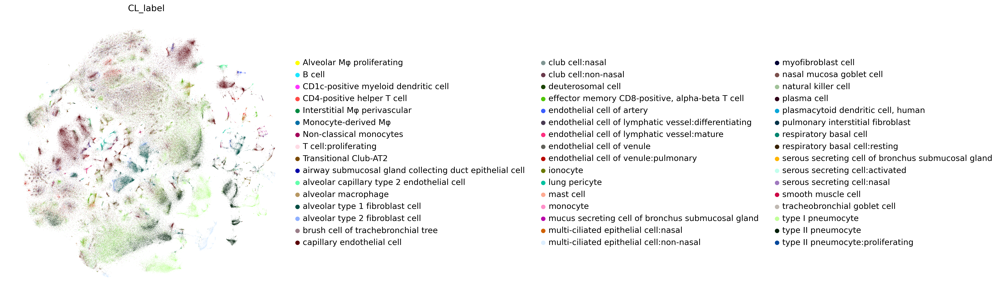

In [25]:
sc.pl.tsne(adata_concat, color=['CL_label'], wspace=0.5, frameon=False)

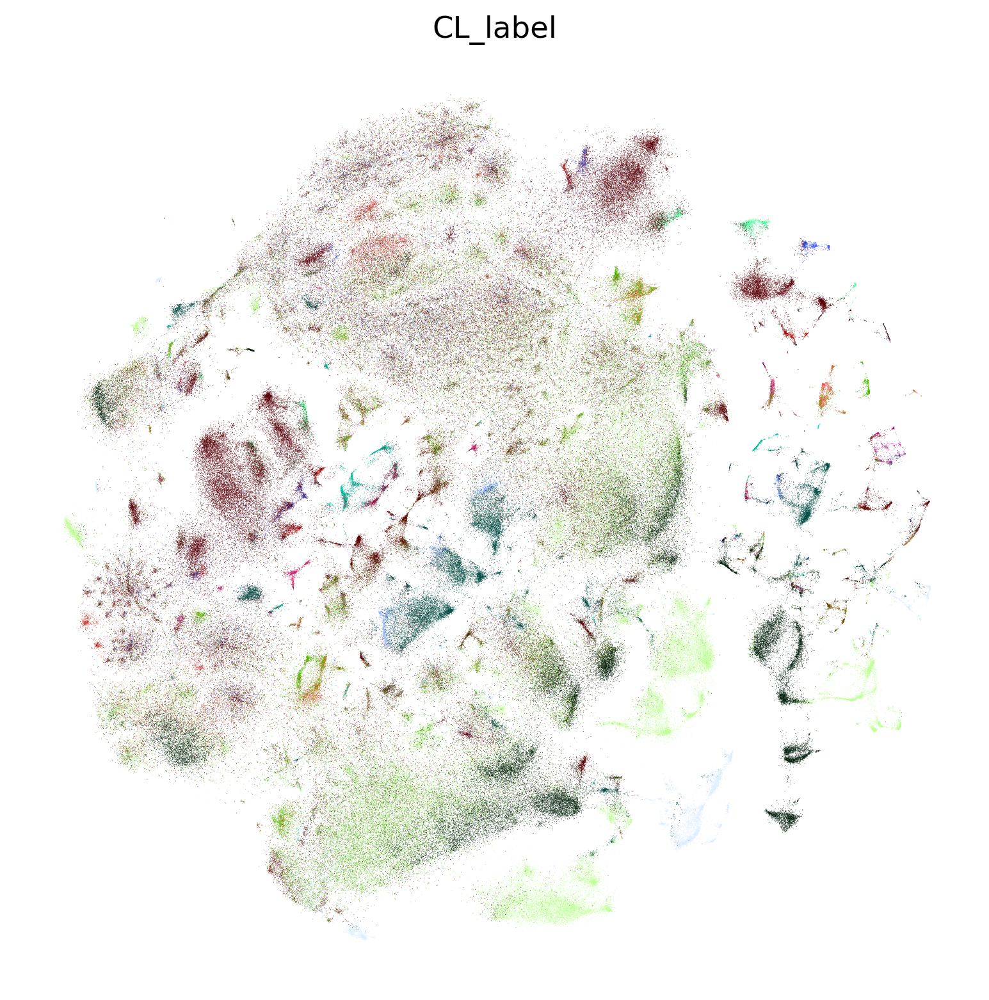

In [26]:
sc.pl.tsne(adata_concat, color=['CL_label'], frameon=False, legend_loc = 'best')

In [27]:
print('cell type number is:', len(adata_concat.obs['CL_label'].value_counts()))
adata_concat.obs['CL_label'].value_counts()

cell type number is: 48


CL_label
capillary endothelial cell                                 119435
type I pneumocyte                                           94120
type II pneumocyte                                          51142
effector memory CD8-positive, alpha-beta T cell             42042
alveolar type 1 fibroblast cell                             25102
multi-ciliated epithelial cell:non-nasal                    24346
CD4-positive helper T cell                                  20184
ionocyte                                                    14056
endothelial cell of venule                                  11042
endothelial cell of artery                                  10208
lung pericyte                                                6133
alveolar capillary type 2 endothelial cell                   4925
alveolar type 2 fibroblast cell                              4324
respiratory basal cell:resting                               3358
smooth muscle cell                                           3066
e

# Try out setting more parameters for the t-SNE algorithm

https://github.com/linnarsson-lab/adult-human-brain/blob/main/notebooks/Preprint/Figure1.ipynb

In [34]:
adata_concat

AnnData object with n_obs × n_vars = 453251 × 60286
    obs: 'CL_label'
    var: 'hugo_symbol'
    uns: 'pca', 'tsne', 'CL_label_colors'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

### For openTSNE package example usage code:

https://opentsne.readthedocs.io/en/latest/examples/01_simple_usage/01_simple_usage.html

In [31]:
from openTSNE import TSNE

pca_target = adata_concat.obsm['X_pca']
xy = TSNE(perplexity=20, exaggeration=1.5).fit(pca_target)

In [63]:
# create np.array matrix based on the previous calculation result

tsne_p_list = []
for i in tqdm(xy):
        
    temp_list = [i[0], i[1]]
    tsne_p_list.append(temp_list)

tsne_p_array = np.array(tsne_p_list)
tsne_p_array.shape

100%|████████████████████████████████████████████████████| 453251/453251 [00:00<00:00, 526769.45it/s]


(453251, 2)

In [64]:
adata_concat.obsm['X_tsne'].shape

(453251, 2)

In [65]:
adata_concat.obsm['X_tsne_p'] = tsne_p_array
adata_concat

AnnData object with n_obs × n_vars = 453251 × 60286
    obs: 'CL_label'
    var: 'hugo_symbol'
    uns: 'pca', 'tsne', 'CL_label_colors'
    obsm: 'X_pca', 'X_tsne', 'X_tsne_p'
    varm: 'PCs'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

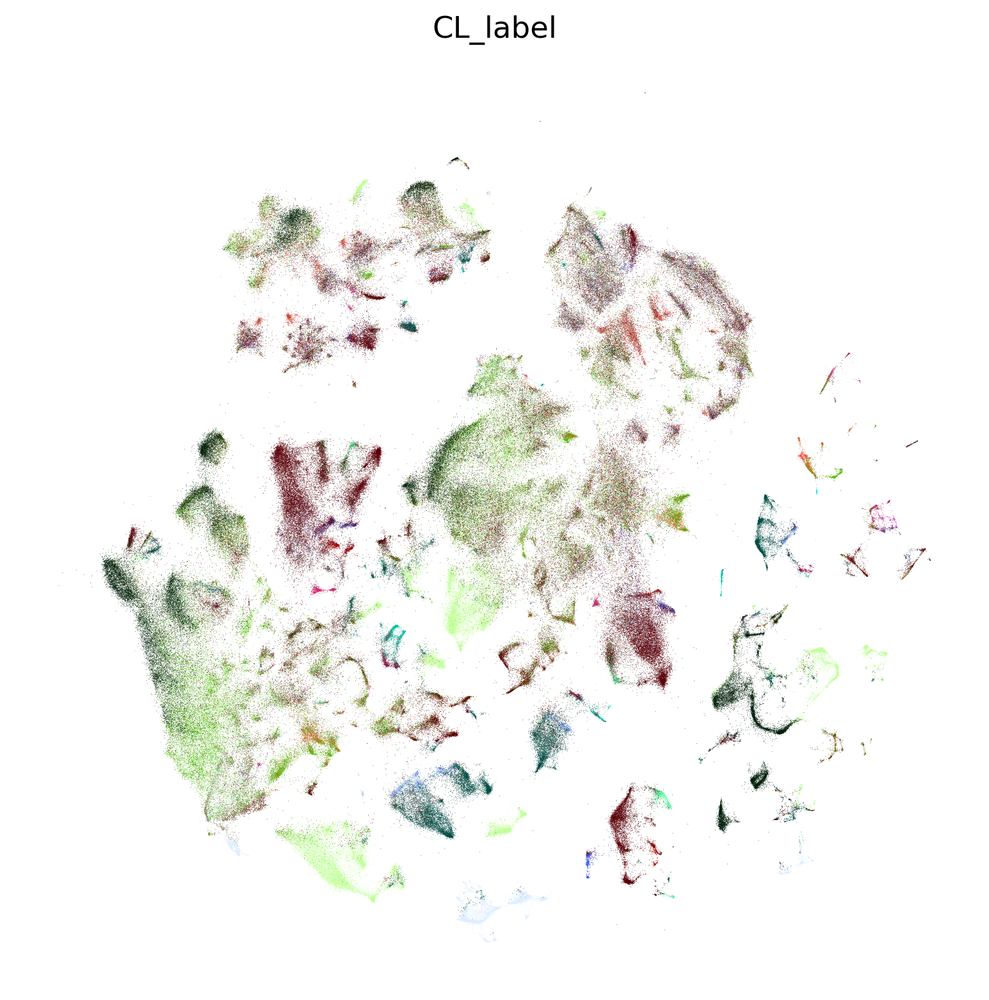

In [73]:
sc.pl.embedding(adata_concat, basis='X_tsne_p', color=['CL_label'], frameon=False, legend_loc = 'best')

## Try other openTSNE parameter settings

https://github.com/linnarsson-lab/adult-human-brain/blob/main/notebooks/Preprint/Figure1.ipynb

In [30]:
from openTSNE import TSNE

pca_target = adata_concat.obsm['X_pca']
xy = TSNE(perplexity=20, exaggeration=2.8).fit(pca_target)

In [31]:
# create np.array matrix based on the previous calculation result

tsne_p_list = []
for i in tqdm(xy):
        
    temp_list = [i[0], i[1]]
    tsne_p_list.append(temp_list)

tsne_p_array = np.array(tsne_p_list)
tsne_p_array.shape

100%|████████████████████████████████████████████████████| 453251/453251 [00:00<00:00, 504573.36it/s]


(453251, 2)

In [32]:
adata_concat.obsm['X_tsne_p0'] = tsne_p_array
adata_concat

AnnData object with n_obs × n_vars = 453251 × 60286
    obs: 'CL_label'
    var: 'hugo_symbol'
    uns: 'pca'
    obsm: 'X_pca', 'X_tsne_p0'
    varm: 'PCs'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

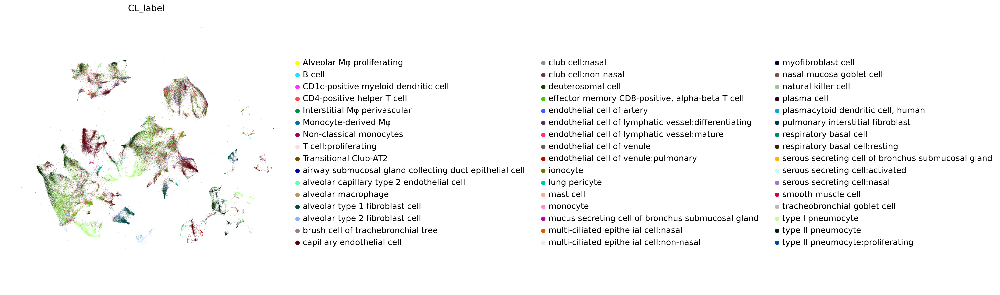

In [33]:
sc.pl.embedding(adata_concat, basis='X_tsne_p0', color=['CL_label'], wspace=0.5, frameon=False)

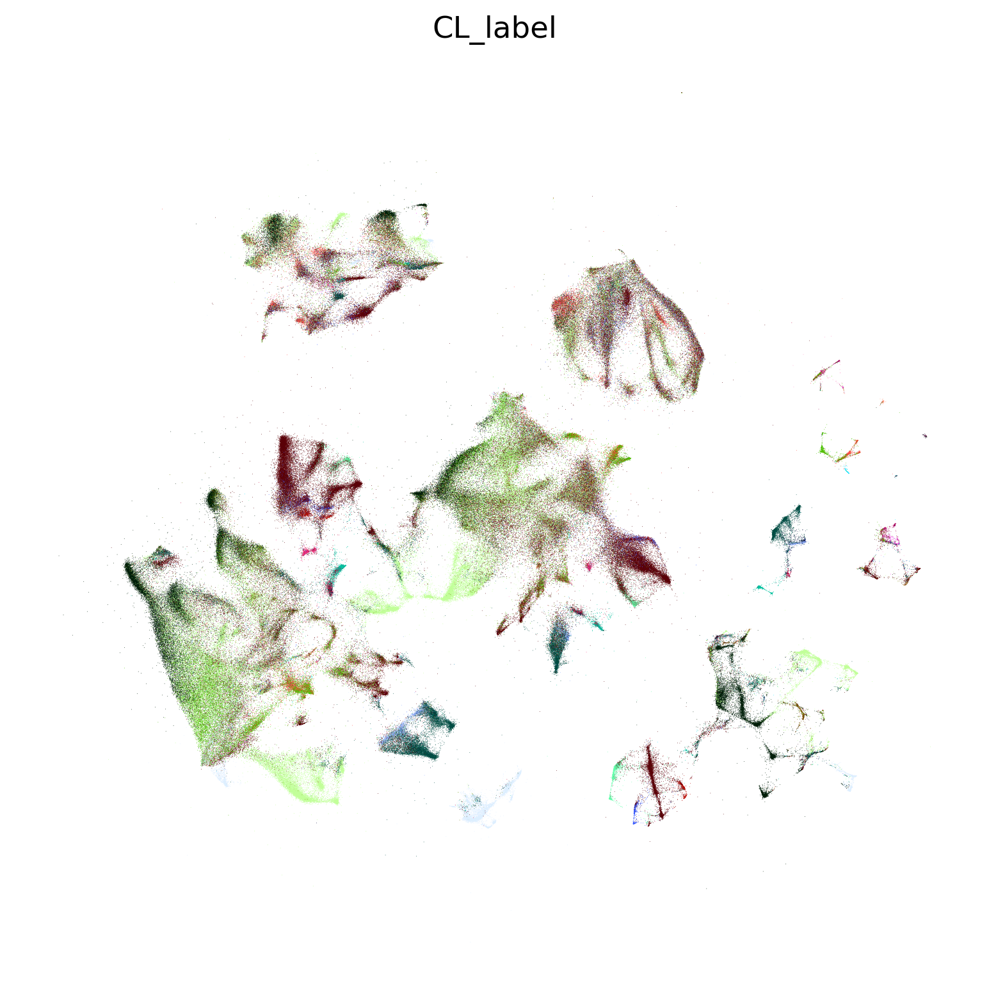

In [34]:
sc.pl.embedding(adata_concat, basis='X_tsne_p0', color=['CL_label'], frameon=False, legend_loc = 'best')